<a href="https://colab.research.google.com/github/moch1996/MachineLearningProj/blob/master/assignment_03_b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised Regression with Multiple Variables
<hr>

## 0. Import library
<ht>

In [1]:
# Import libraries

# math library
import numpy as np

# visualization library
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png2x','pdf')
import matplotlib.pyplot as plt

# machine learning library
from sklearn.linear_model import LinearRegression

# 3d visualization
from mpl_toolkits.mplot3d import axes3d

# computational time
import time

## 1. Load dataset
<hr>

Load a set of data points $\{ (x_i, y_i, z_i) \}_{i=1}^n$ where $x_i$ and $y_i$ are considered as an input and $z_i$ is considered as an output for $i$-th data point.

In [53]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)

In [62]:
data_noisy[0,0] = -1
data_clean[0,0] = -1

## 2. Explore the dataset distribution
<hr>

Plot the training data points in 3D cartesian coordinate system.
(You may use matplotlib function `scatter3D()`.)

Text(0.5, 0.98, 'Clean data')

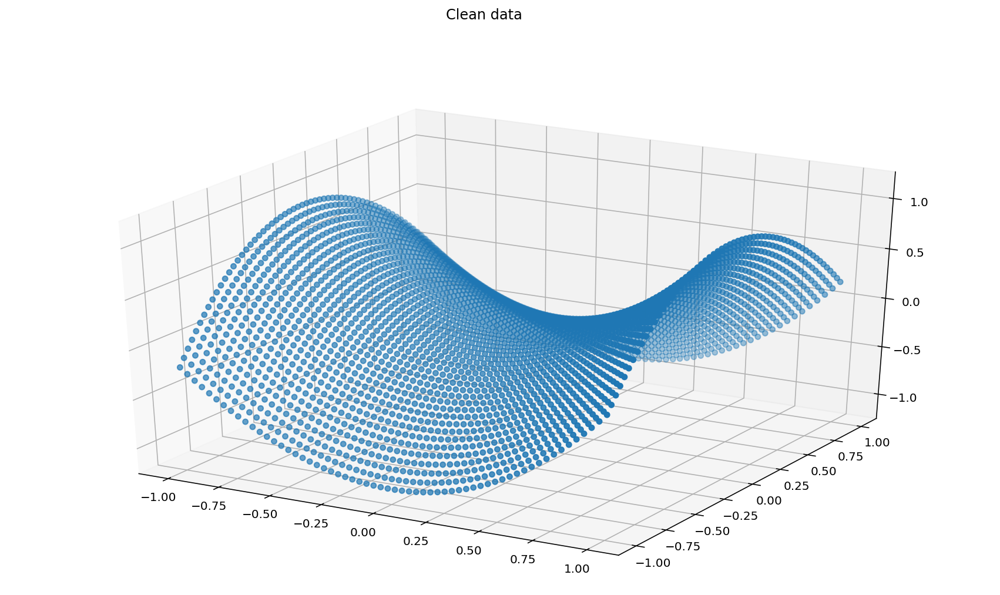

In [64]:
#clean data 3d scatter plot
plt.rcParams["figure.figsize"] = (15,8)
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]

fig = plt.figure()

ax = fig.gca(projection='3d')
ax.scatter(x_clean, y_clean, z_clean)
plt.suptitle('Clean data')

Text(0.5, 0.98, 'Noisy data')

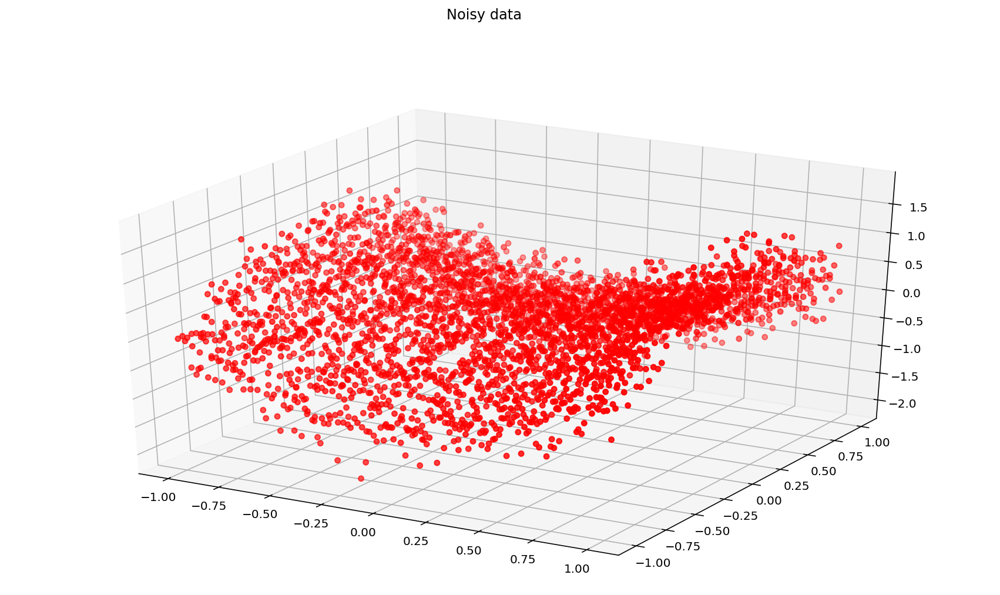

In [65]:
#noisy data 3d scatter plot
plt.rcParams["figure.figsize"] = (15,8)
x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]

fig = plt.figure()

ax = fig.gca(projection='3d')
ax.scatter(x_train, y_train, z_train, c='r')
plt.suptitle('Noisy data')

## 3. Define the prediction function 
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

where feature function $f$ is defined as follows:

$$
\begin{align*}
    f_0(x, y) &= \\
    f_1(x, y) &= \\
    f_2(x, y) &= \\
    f_3(x, y) &= \\
    f_4(x, y) &= \\
    f_5(x, y) &= \\
    f_6(x, y) &= \\
    f_7(x, y) &= \\
    f_8(x, y) &= \\
    f_9(x, y) &= 
\end{align*}
$$

### Vectorized implementation:

$$
f_w(x) = X w 
$$
with 
<br>
$$
X = 
\left[ 
\begin{array}{cccc}
f_0(x_1, y_1) & f_1(x_1, y_1) & f_2(x_1, y_1) & f_3(x_1, y_1) & f_4(x_1, y_1) & f_5(x_1, y_1) & f_6(x_1, y_1) & f_7(x_1, y_1) & f_8(x_1, y_1) & f_9(x_1, y_1) \\
f_0(x_2, y_2) & f_1(x_2, y_2) & f_2(x_2, y_2) & f_3(x_2, y_2) & f_4(x_2, y_2) & f_5(x_2, y_2) & f_6(x_2, y_2) & f_7(x_2, y_2) & f_8(x_2, y_2) & f_9(x_2, y_2) \\
\vdots\\
f_0(x_n, y_n) & f_1(x_n, y_n) & f_2(x_n, y_n) & f_3(x_n, y_n) & f_4(x_n, y_n) & f_5(x_n, y_n) & f_6(x_n, y_n) & f_7(x_n, y_n) & f_8(x_n, y_n) & f_9(x_n, y_n)
\end{array} 
\right]
\quad
\textrm{ and }
\quad
w = 
\left[ 
\begin{array}{cccc}
w_0 \\ 
w_1 \\
w_2 \\ 
w_3 \\ 
w_4 \\ 
w_5 \\
w_6 \\
w_7 \\
w_8 \\
w_9
\end{array} 
\right]
$$

Implement the vectorized version of the predictive function. <br>

In [66]:
# construct data matrix

n = data_noisy.shape[0]
X = np.ones([n,10]) 

X[:,1] = x_train
X[:,2] = y_train
X[:,3] = (x_train)**2
X[:,4] = (y_train)**2
X[:,5] = (x_train)*(y_train)
X[:,6] = ((x_train)**2)*(y_train)
X[:,7] = (x_train)*((y_train)**2)
X[:,8] = (x_train)**3
X[:,9] = (y_train)**3

print(X.shape)

(3600, 10)


In [67]:
# parameters vector
w = np.array([1,1,1,1,1,1,1,1,1,1])[:,None] # [:,None] adds a singleton dimension

print(w.shape)

(10, 1)


In [68]:
# predictive function definition
def f_pred(X,w): 
    
    f = np.dot(X,w)
    
    return f 

# Test predicitive function 
z_pred = f_pred(X,w)
print(z_pred.shape)

(3600, 1)


## 4. Define the regression loss 
<hr>
$$
L(w)=\frac{1}{n} \sum_{i=1}^n \ \Big( f_w(x_i, y_i) – z_i \Big)^2
$$

### Vectorized implementation:

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$
with 
<br>
$$
Xw=
\left[ 
\begin{array}{cccc}
f_w(x_1, y_1) \\ 
f_w(x_2, y_2) \\ 
\vdots\\
f_w(x_n, y_n) \\ 
\end{array} 
\right]
\quad
\textrm{ and }
\quad
z = 
\left[ 
\begin{array}{cccc}
z_1 \\ 
z_2 \\ 
\vdots\\
z_n
\end{array} 
\right]
$$

Implement the vectorized version of the regression loss function. <br>


In [ ]:
a = np.array([1,2,3,4,5,6])
b = np.array([2,3,4,5,6,7])
print(b.shape)
c = a*b
print(c)
a2 = a.reshape(6,1)
b2 = b.reshape(6,1)
print(a2,a2.shape)
print(b2,b2.shape)
c2 = a2*b2
print(c2)
c3 = np.dot(a2.T,b2)
print(c3)

In [69]:
# loss function definition
def loss_mse(z_pred,z): 
    n = len(z)
    matrix = z_pred - z
    loss = np.dot(matrix.T,matrix)*(1/n)
    
    return loss

In [70]:
# Test loss function 
z = z_train.reshape(3600,1) # label
z_pred = f_pred(X,w) # prediction

loss = loss_mse(z_pred,z)
print(loss.shape,loss)

(1, 1) [[6.01881136]]


## 5. Define the gradient of the regression loss 
<hr>

$\bullet$ Vectorized implementation: Given the loss

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$

The gradient is given by  

$$
\frac{\partial}{\partial w} L(w) = \frac{2}{n} X^T(Xw-z)
$$


Implement the vectorized version of the gradient of the regression loss function.

In [79]:
# gradient function definition
def grad_loss(z_pred,z,X):
    n = len(z)
    grad = np.dot(X.T,(z_pred-z))*(2/n)
    
    return grad


# Test grad function 
z_pred = f_pred(X,w)
grad = grad_loss(z_pred,z,X)

print(grad.shape, grad.T)

(10, 1) [[3.38571448 1.30011645 1.30875439 1.16927356 1.54143321 0.2403229
  0.51469838 0.51429442 0.85188899 0.85590183]]


## 6. Implement the gradient descent algorithm 
<hr>

### Vectorized implementation: 

$$
w^{k+1} = w^{k} - \tau  \frac{2}{n} X^T(Xw^{k}-z)
$$

Implement the vectorized version of the gradient descent function.

Plot the loss values $L(w^k)$ with respect to iteration $k$ the number of iterations.

In [89]:
def gradient_descent(X, z, w_init= np.array([1,1,1,1,1,1,1,1,1,1])[:,None], tau=0.01, iteration=100) :
  
     n = len(z)
     loss_history = np.zeros(iteration)
     coef_history = np.zeros((iteration,10))
     w = w_init

     for i in range(iteration) :

       z_pred = f_pred(X,w)
       w = w - tau*(grad_loss(z_pred,z,X))

       coef_history[i,:] = w.T
       loss_history[i] = loss_mse(z_pred,z)
     return w, loss_history, coef_history

In [ ]:
start = time.time()
w_init = w
tau = 0.02
iteration = 3000

w_init,loss_history,coef_history = gradient_descent(X,z,w_init,tau,iteration) 

print('Time=',time.time() - start) # plot the computational cost
print(loss_history[-1] ) # plot the last value of the loss
print(coef_history[-1].reshape(10,1) ) # plot the last value of the parameter w 

last loss value = 0.08835586738871964
last vector = 
[[-0.00837947]
 [-0.00323899]
 [-0.0416803 ]
 [ 0.98687351]
 [-0.97308457]
 [-0.01179621]
 [ 0.04572958]
 [ 0.00865012]
 [ 0.12450077]
 [ 0.14601623]]


<Figure size 720x720 with 0 Axes>

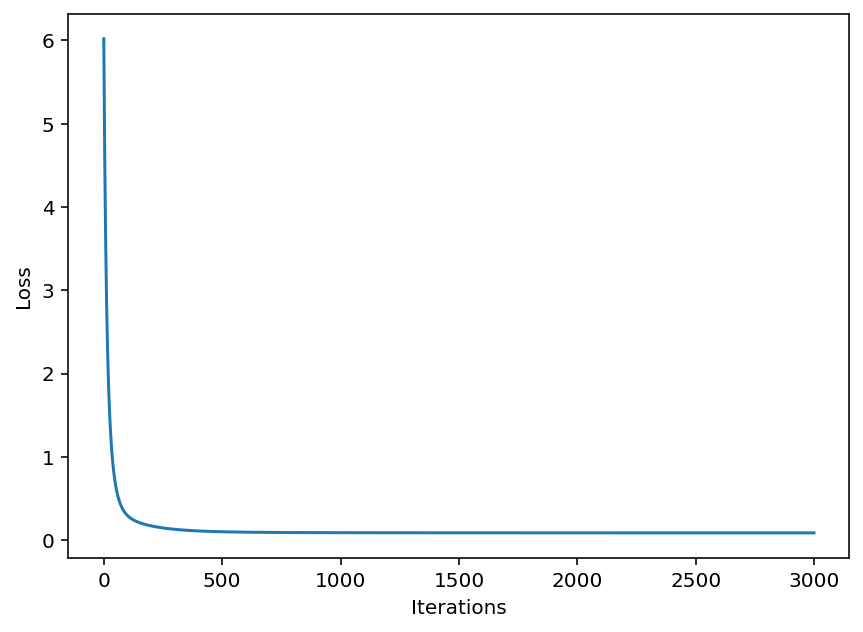

In [130]:
# plot loss function

print("last loss value = {}".format(loss_history[-1])) # plot the last value of the loss
print("last vector = \n{}".format(coef_history[-1].reshape(10,1)) ) # plot the last value of the parameter w 
plt.figure(2)
plt.figure(figsize=(7,5))

plt.plot(range(iteration),loss_history) # plot the loss curve
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

## 7. Plot the prediction function
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

(You may use numpy function `meshgrid` and `plot_surface` for plot the linear prediction function.)

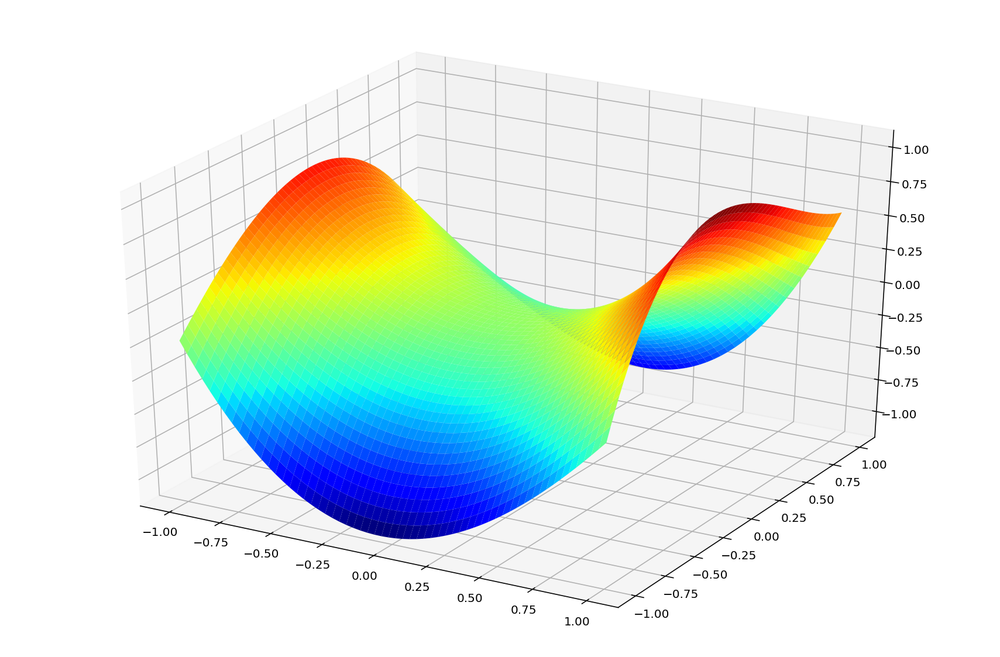

In [ ]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = 

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')

## 8. Plot the prediction function superimposed on the training data
<hr>

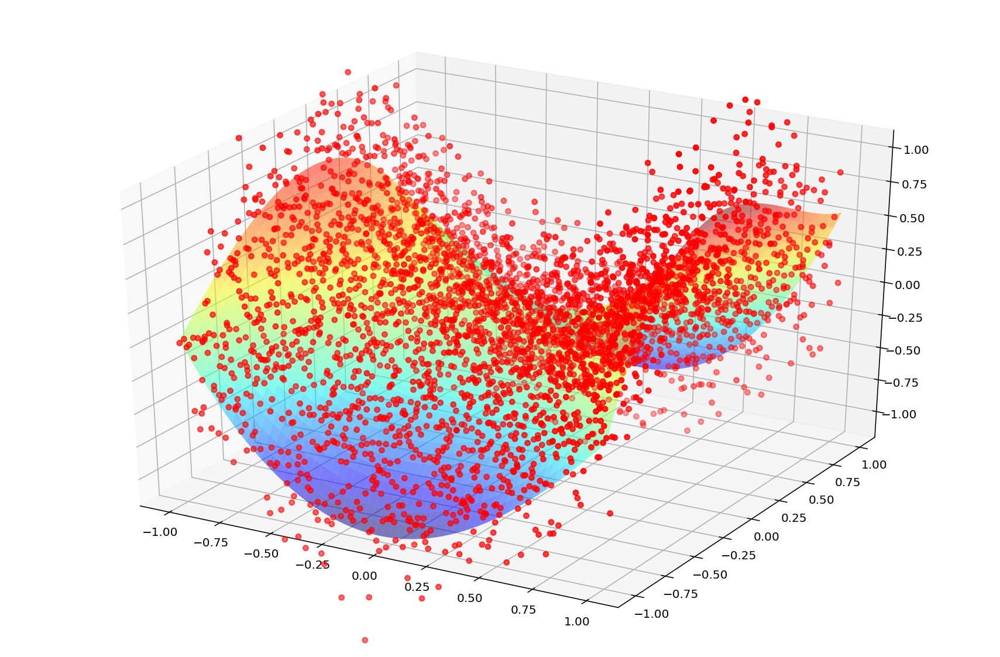

In [ ]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = 

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')

# Output results

## 1. Plot the clean data in 3D cartesian coordinate system (1pt)

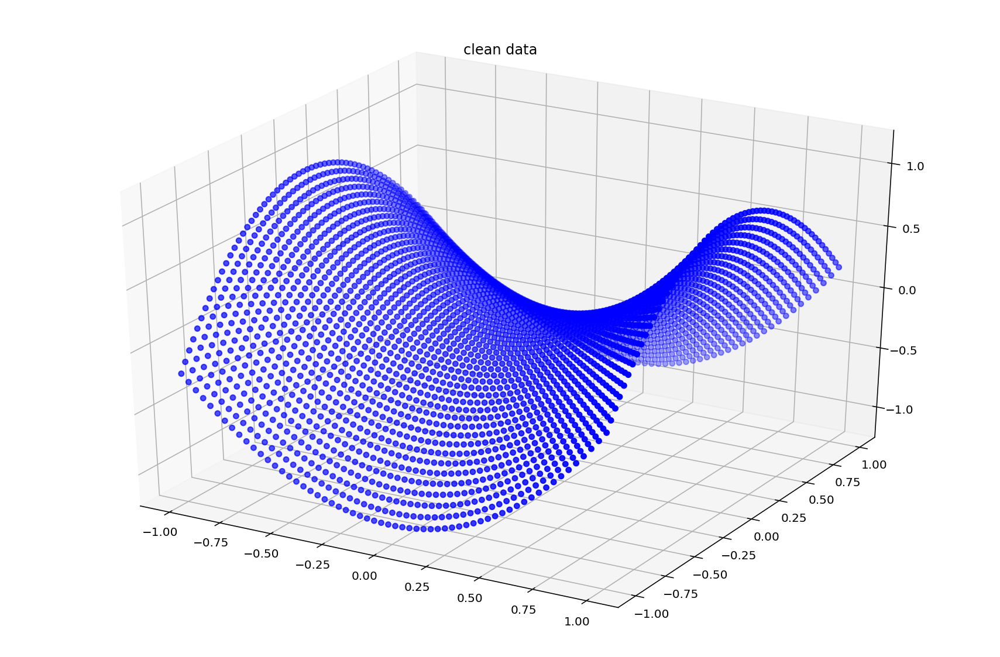

## 2. Plot the noisy data in 3D cartesian coordinate system (1pt)

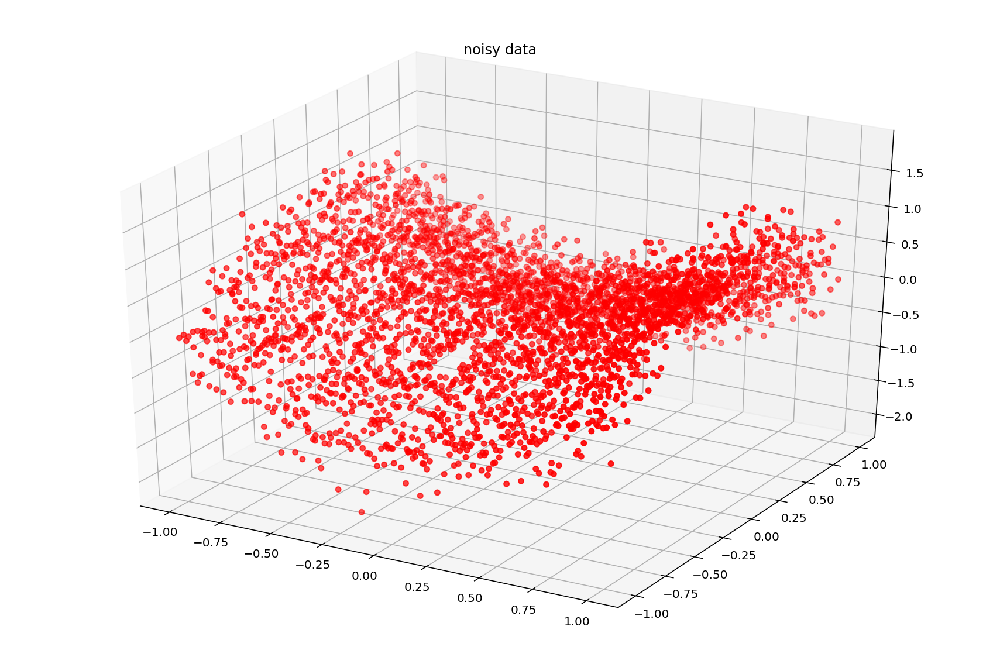

## 3. Plot the loss curve in the course of gradient descent (2pt)

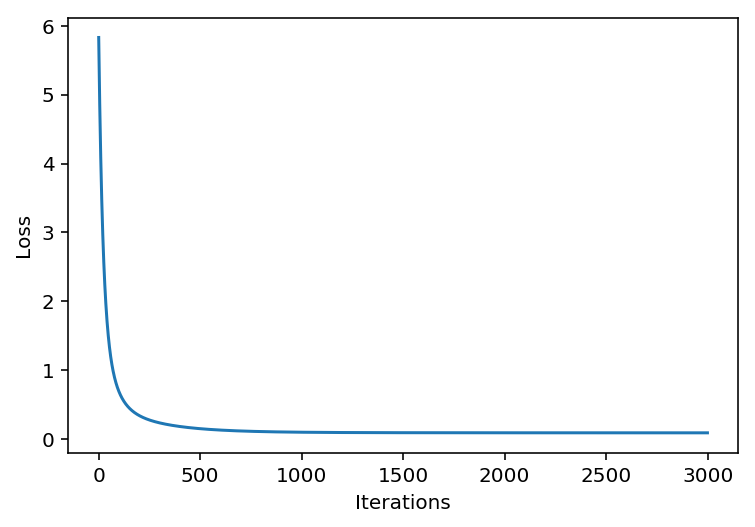

## 4. Print out the final loss value at convergence of the gradient descent (1pt)

loss at convergence = 0.08962464628525693


## 5. Print out the final model parameter values at convergence of the gradient descent (1pt)

model parameter: w_0 = [0.01777274]
model parameter: w_1 = [-0.02098745]
model parameter: w_2 = [-0.04291947]
model parameter: w_3 = [-0.1563118]
model parameter: w_4 = [0.91204373]
model parameter: w_5 = [-1.04138972]
model parameter: w_6 = [0.19559365]
model parameter: w_7 = [0.1567887]
model parameter: w_8 = [0.17254511]
model parameter: w_9 = [0.35882525]


## 6. Plot the prediction function in 3D cartesian coordinate system (2pt)

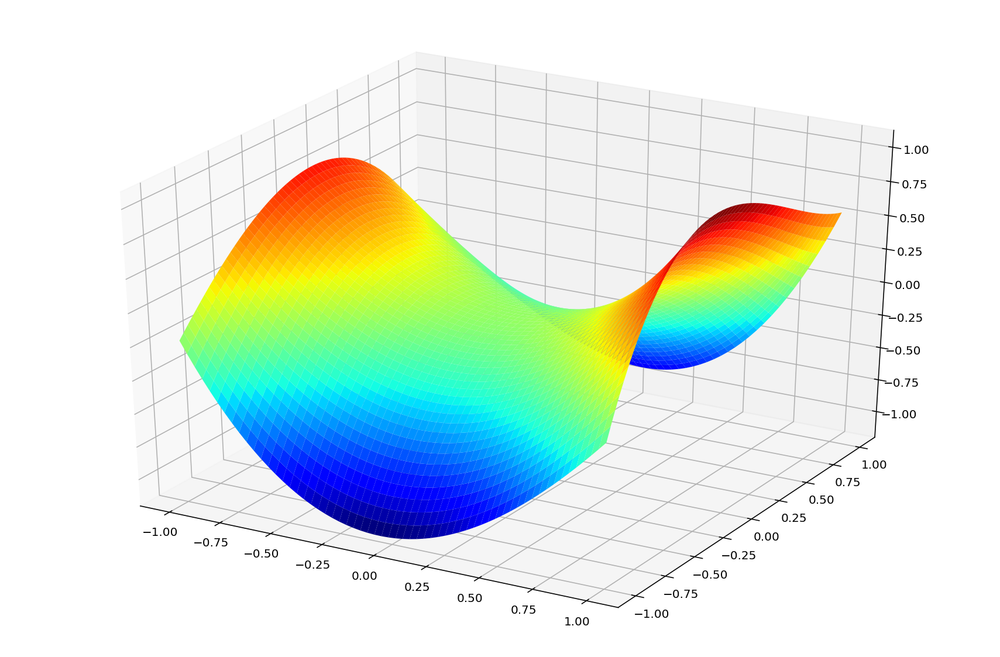

## 7. Plot the prediction functions superimposed on the training data (2pt)

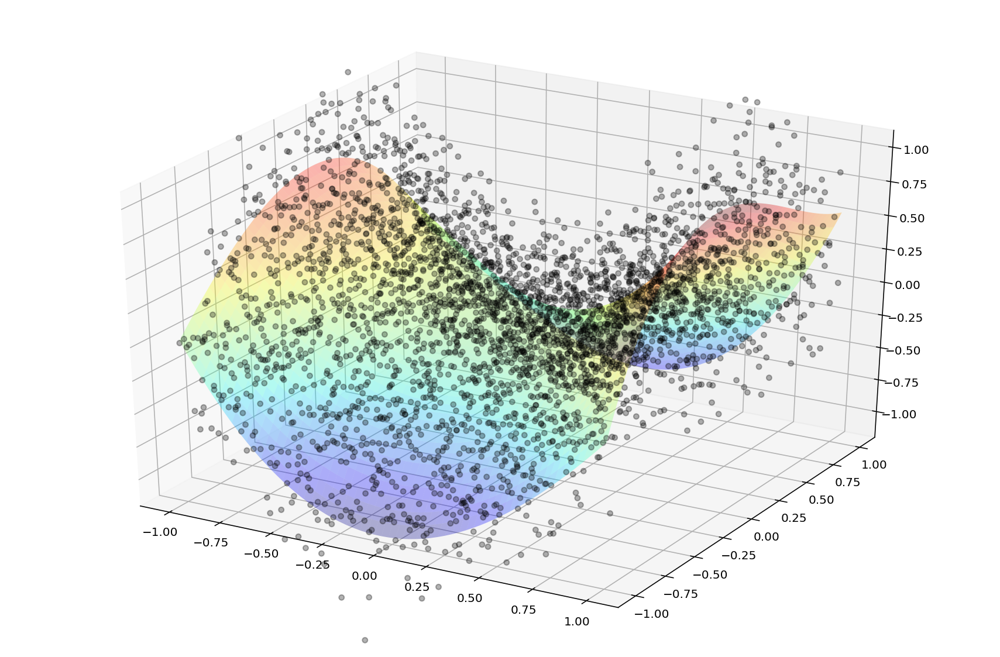